### WINE QUALITY ANALYSIS

In [1]:
#TASK 2
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import plotly.express as px
import plotly.graph_objects as go
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report,accuracy_score
from sklearn.preprocessing import LabelEncoder

In [2]:
df=pd.read_csv('WineQT.csv')

In [3]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,1
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,2
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,3
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,4


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1143 entries, 0 to 1142
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1143 non-null   float64
 1   volatile acidity      1143 non-null   float64
 2   citric acid           1143 non-null   float64
 3   residual sugar        1143 non-null   float64
 4   chlorides             1143 non-null   float64
 5   free sulfur dioxide   1143 non-null   float64
 6   total sulfur dioxide  1143 non-null   float64
 7   density               1143 non-null   float64
 8   pH                    1143 non-null   float64
 9   sulphates             1143 non-null   float64
 10  alcohol               1143 non-null   float64
 11  quality               1143 non-null   int64  
 12  Id                    1143 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 116.2 KB


In [5]:
df.isnull().sum()#obtaining null values

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
Id                      0
dtype: int64

In [6]:
df.nunique()#unique values

fixed acidity             91
volatile acidity         135
citric acid               77
residual sugar            80
chlorides                131
free sulfur dioxide       53
total sulfur dioxide     138
density                  388
pH                        87
sulphates                 89
alcohol                   61
quality                    6
Id                      1143
dtype: int64

### NUMERICAL COLUMNS

In [7]:
df.columns
num_col1=[]
for col in df.columns:
    if(df[col].dtypes != 'objects'):
        num_col1.append(col)
print(num_col1)

['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol', 'quality', 'Id']


In [8]:
#categorical columns
df.columns
num_col=[]
for col in df.columns:
    if(df[col].dtypes == 'objects'):
        num_col.append(col)
print(num_col)

[]


### STATISTICS

In [9]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
count,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000
mean,8.311111,0.531339,0.268364,2.532152,0.086933,15.615486,45.914698,0.996730,3.311015,0.657708,10.442111,5.657043,804.969379
std,1.747595,0.179633,0.196686,1.355917,0.047267,10.250486,32.782130,0.001925,0.156664,0.170399,1.082196,0.805824,463.997116
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000,0.000000
25%,7.100000,0.392500,0.090000,1.900000,0.070000,7.000000,21.000000,0.995570,3.205000,0.550000,9.500000,5.000000,411.000000
50%,7.900000,0.520000,0.250000,2.200000,0.079000,13.000000,37.000000,0.996680,3.310000,0.620000,10.200000,6.000000,794.000000
75%,9.100000,0.640000,0.420000,2.600000,0.090000,21.000000,61.000000,0.997845,3.400000,0.730000,11.100000,6.000000,1209.500000
max,15.900000,1.580000,1.000000,15.500000,0.611000,68.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000,1597.000000


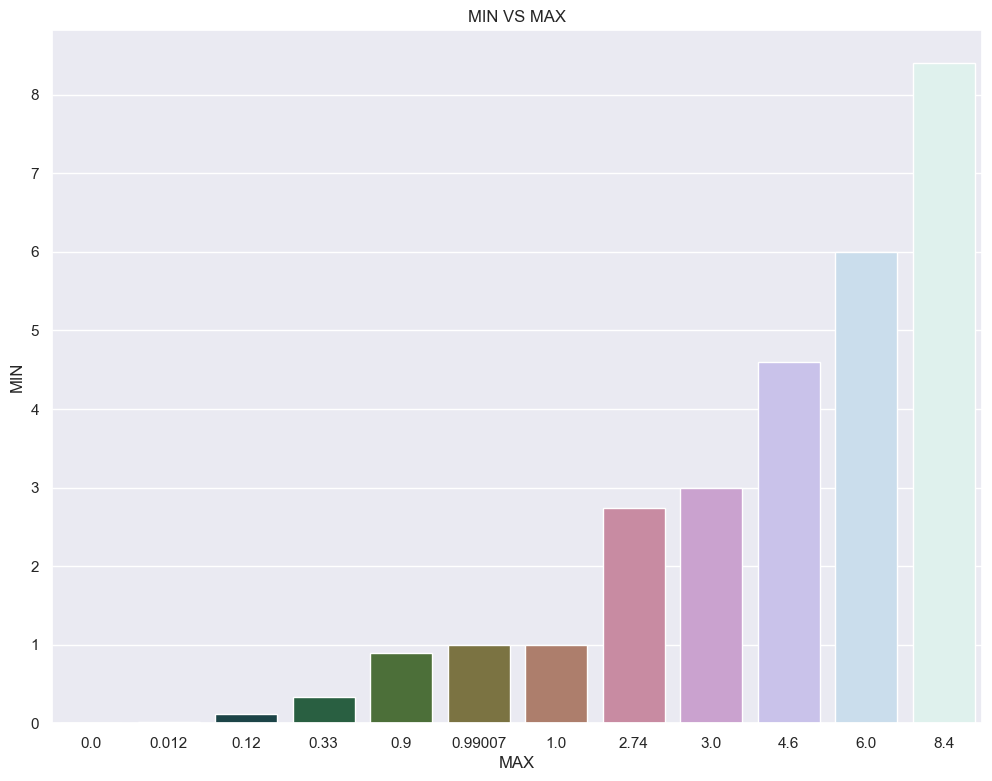

In [10]:
take1=df.max()
take2=df.min()
plt.figure(figsize=(12,9))
sns.barplot(x=take2,y=take2,data=df,palette='cubehelix')
plt.xlabel('MAX')
plt.ylabel('MIN')
plt.title("MIN VS MAX")
plt.show()

In [11]:
df.std()

fixed acidity             1.747595
volatile acidity          0.179633
citric acid               0.196686
residual sugar            1.355917
chlorides                 0.047267
free sulfur dioxide      10.250486
total sulfur dioxide     32.782130
density                   0.001925
pH                        0.156664
sulphates                 0.170399
alcohol                   1.082196
quality                   0.805824
Id                      463.997116
dtype: float64

In [12]:
df.count()

fixed acidity           1143
volatile acidity        1143
citric acid             1143
residual sugar          1143
chlorides               1143
free sulfur dioxide     1143
total sulfur dioxide    1143
density                 1143
pH                      1143
sulphates               1143
alcohol                 1143
quality                 1143
Id                      1143
dtype: int64

### EXPLORATORY DATA ANALYSIS 
- THE MAIN CHARACTERSTIC OF THIS EDA ANALYSIS IS TO OBTAIN THE NORMAL QUALITY OF WINE .
- FIRST WE NEED TO ABSOLUETLY SEGREGATE THE COLUMNS AND MINIMIZE IT .
- PH VALUE IS ONE OF THE MOST IMPORTANT FACTOR THAT ARE USED TO DISPLAY THE QUALITY .
- MOVING FOWARD THROUGH ANALYSIS OF THE QUALITY OF WINE AND DISPLAYING THEM ALONG WITH THERE ID.
- PH VS ACIDIDTY.
- CHEMICAL QUANTITIES VS PH .
- QUALITY VS CHEMICAL QUANTITIES.

In [13]:
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'Id'],
      dtype='object')

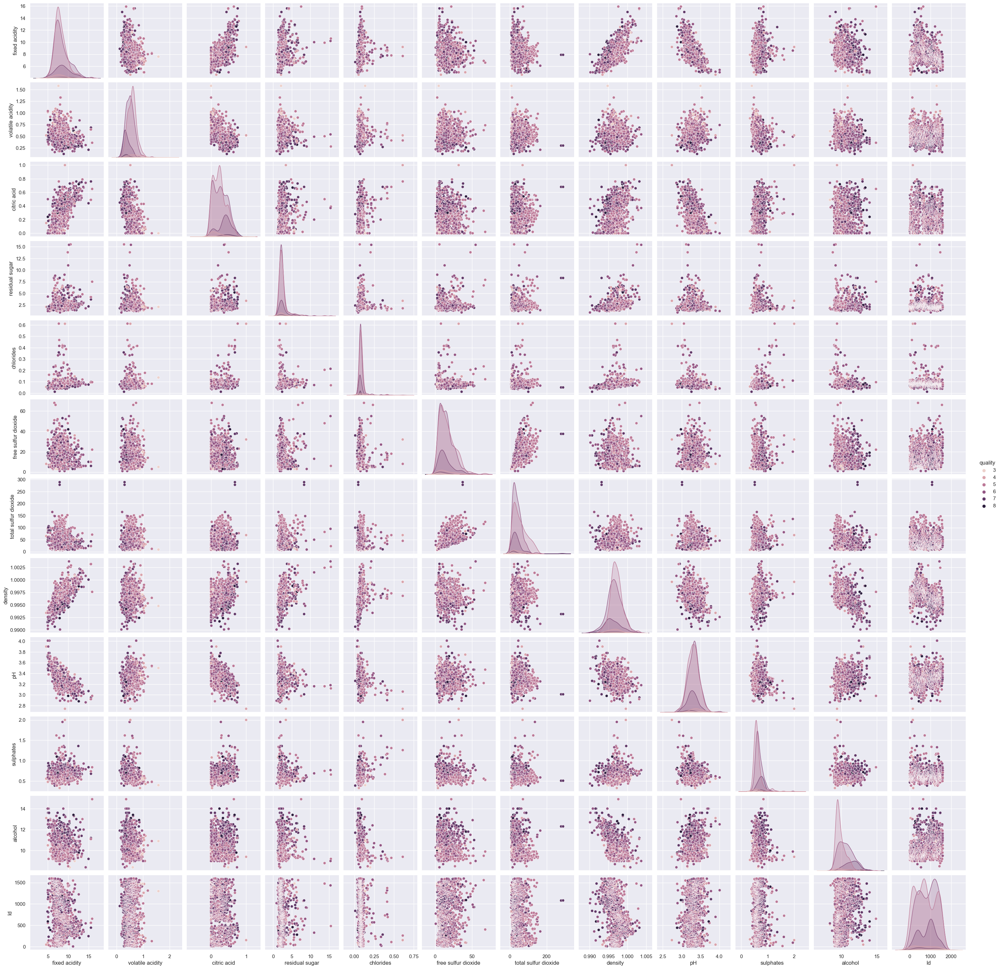

In [14]:
sns.pairplot(data=df,hue='quality')
plt.show()#it will take some time....

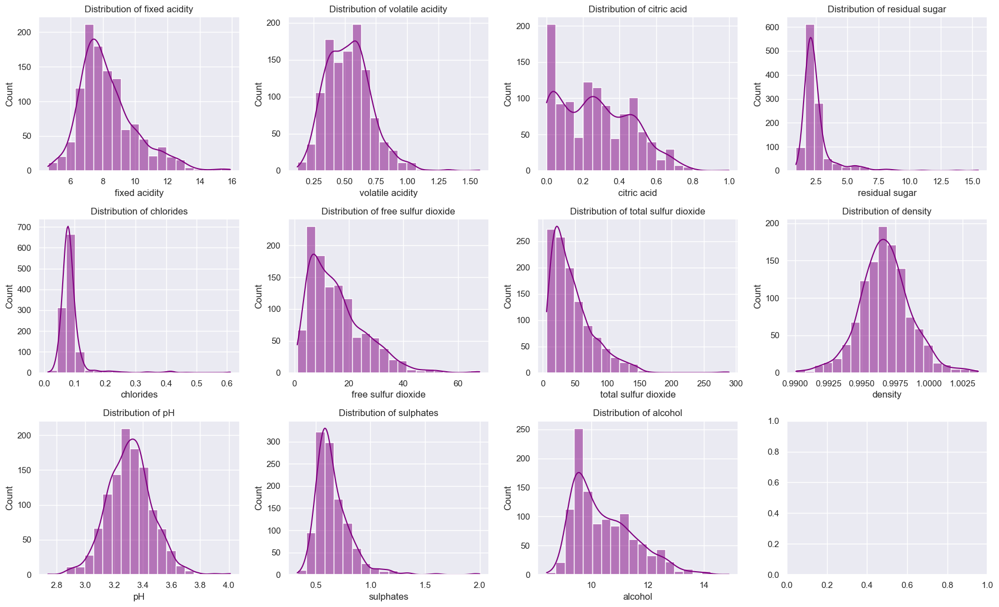

In [15]:
fig, axes= plt.subplots(nrows=3, ncols=4, figsize=(18, 11))

# Flatten the axes array for easire indexing
axes = axes.flatten()
num_col1 = df.select_dtypes(include=['float64']).columns
for i, column in enumerate(num_col1):
    sns.histplot(df[column], ax=axes[i], kde=True, bins=20, color='purple')
    axes[i].set_title(f'Distribution of {column}')
plt.tight_layout()
plt.show()#distribution of the features 

Text(0.5, 1.0, 'TOTAL ACIDITY')

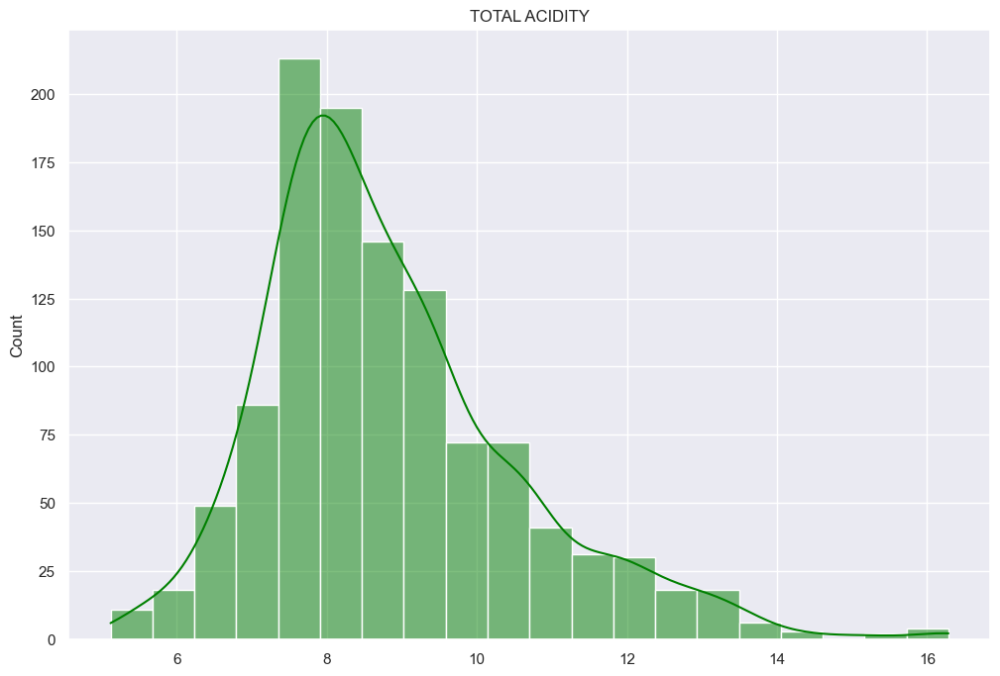

In [17]:
#the total aciddity present in the wine 
acidity=df['fixed acidity']+df['volatile acidity']
plt.figure(figsize=(12,8))
sns.histplot(x=acidity,data=df,bins=20,kde=True,color='green')
plt.title('TOTAL ACIDITY')

PH VS ACIDITY

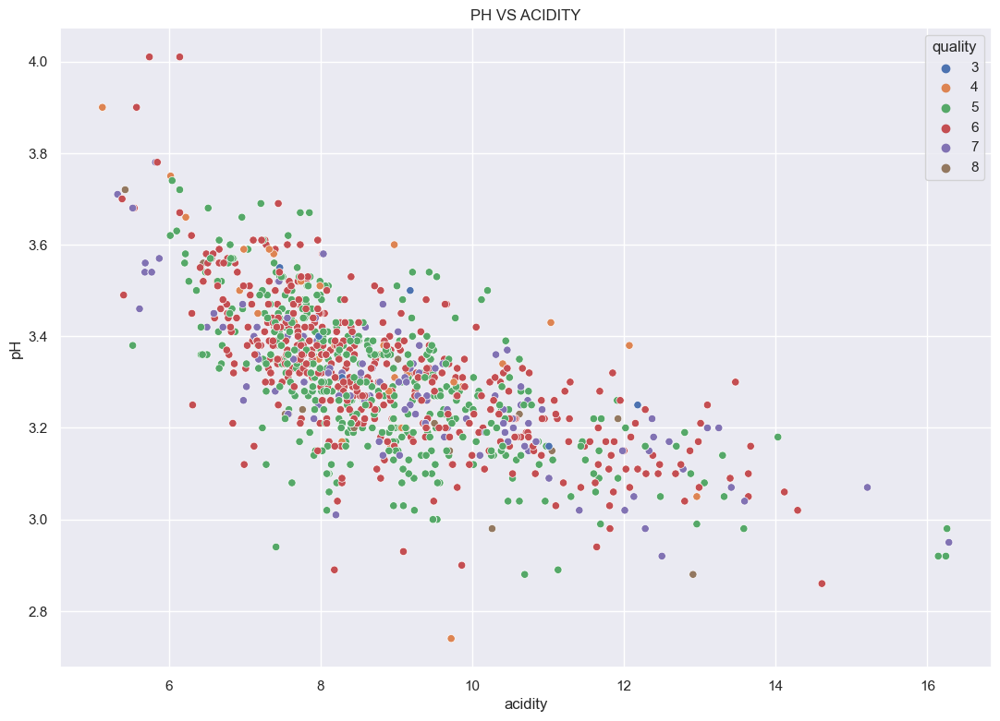

In [18]:
plt.figure(figsize=(13,9))
sns.scatterplot(x=acidity,y='pH',data=df,hue='quality',palette='deep')
plt.title("PH VS ACIDITY")
plt.xlabel("acidity")
plt.show()

PH VS CHEMICAL QUANTITIES 

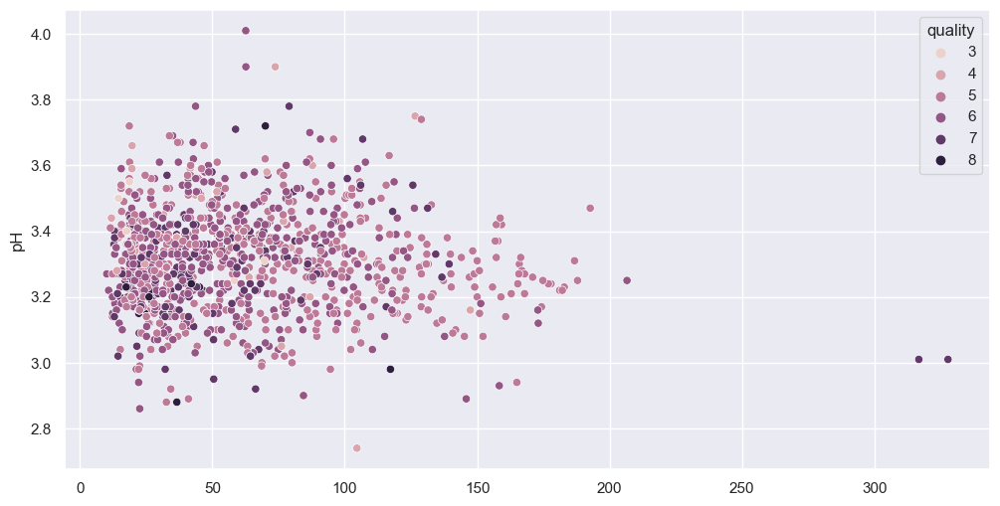

In [19]:
plt.figure(figsize=(12,6))
df['chemical']=df['free sulfur dioxide']+df['total sulfur dioxide']
chemical_qualities=df['citric acid']+df['chlorides']+df['sulphates']+df['chemical']
sns.scatterplot(x=chemical_qualities,y='pH',data=df,hue='quality')
plt.show()

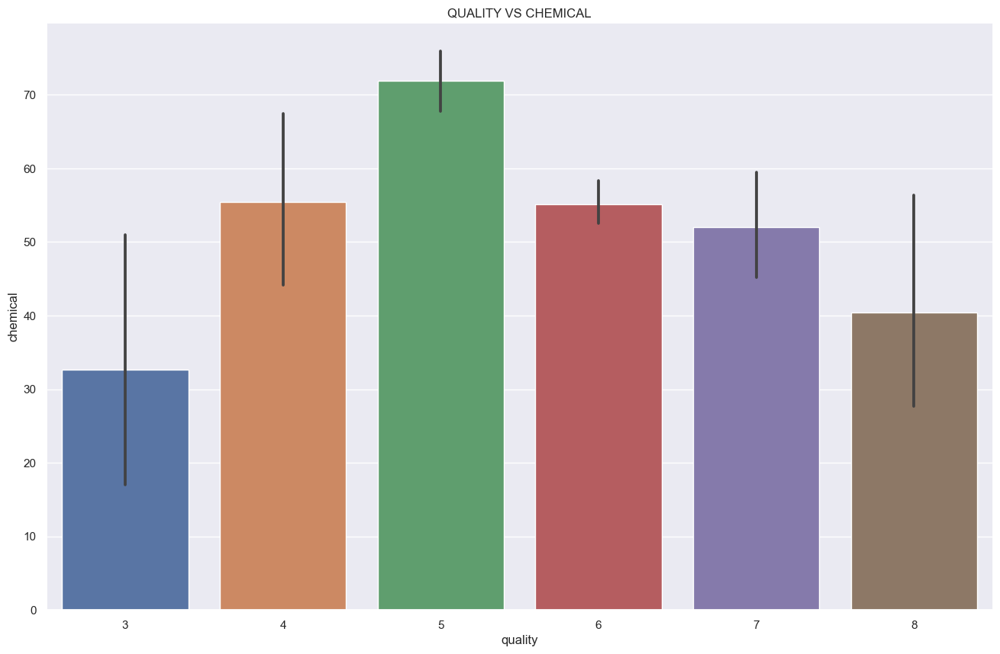

In [20]:
df['chemical']=df['free sulfur dioxide']+df['total sulfur dioxide']
plt.figure(figsize = (16, 10))
sns.barplot(x='quality',y='chemical',data=df,palette='deep')
plt.title('QUALITY VS CHEMICAL')
plt.show()

In [21]:
for column in df.columns:
    fig = px.box(df, y=column, title=f'Box plot for {column}')
    fig.show()

In [22]:
bins=[2,6.5,8]
classes=['bad','good']
df['quality']=pd.cut(df['quality'],bins=bins,labels=classes)
#classsification of the quality of wine into two category bad and good

In [23]:
label_quality=LabelEncoder()

In [24]:
df['quality']=label_quality.fit_transform(df['quality'])

In [25]:
df['quality'].value_counts()

0    984
1    159
Name: quality, dtype: int64

### 0 Indicates bad quality while 1 indicates good

C:\Users\Tanusree\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0.5, 1.0, 'BAD AND GOOD WINE')

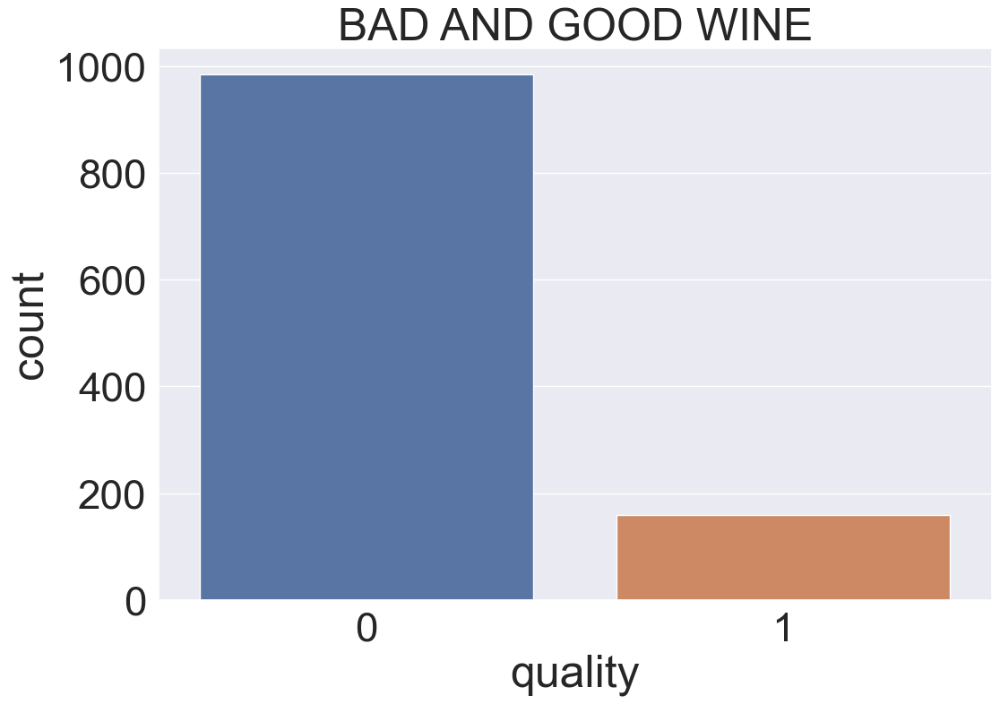

In [27]:
plt.figure(figsize=(12,8))
sns.set(font_scale=3)
sns.countplot(df['quality'])
plt.title('BAD AND GOOD WINE')

## RandomForestClassifier

In [28]:
x=df.drop(['quality'],axis=1)

In [29]:
y=df['quality']
y

0       0
1       0
2       0
3       0
4       0
       ..
1138    0
1139    0
1140    0
1141    0
1142    0
Name: quality, Length: 1143, dtype: int32

In [30]:
y.value_counts()

0    984
1    159
Name: quality, dtype: int64

In [31]:
#using lambda function
y=y.apply(lambda y_value:1 if y_value>=1 else 0)
y.value_counts()

0    984
1    159
Name: quality, dtype: int64

# SPLITTING AND TRAINING THE DATASET

In [33]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=2529,stratify=y)

In [34]:
x_train.shape ,x_test.shape ,y_train.shape,y_test.shape

((914, 13), (229, 13), (914,), (229,))

In [35]:
rf=RandomForestClassifier(n_estimators=100)
rf.fit(x_train,y_train)
pred_rf=rf.predict(x_test)

In [36]:
predict1=accuracy_score(y_test,pred_rf)
print(predict1*100)

88.20960698689956


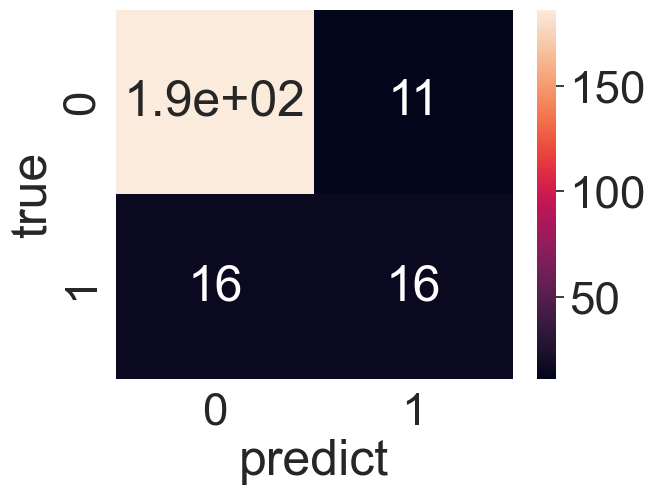

In [37]:
cml=confusion_matrix(y_test,pred_rf)
ax1= sns.heatmap(cml,annot=True)
ax1.set(xlabel='predict',ylabel='true')
plt.show()

In [38]:
model = RandomForestClassifier()

In [39]:
model.fit(x_train,y_train)

RandomForestClassifier()

In [40]:
y_test_predict=model.predict(x_test)

In [41]:
accuracy_t=metrics.accuracy_score(y_test_predict,y_test)

In [42]:
accuracy_t

0.9039301310043668

# The accuracy of the model is 90% for randomforestclassifier.In google colab it prooduces 100%
## The value changes soemtimes

# STOCHASTIC GRADIENT DESCENT 

In [43]:
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [44]:
sgd_clf = SGDClassifier(loss='log', max_iter=1000, random_state=42)

In [45]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(x_train)
X_test_scaled = scaler.transform(x_test)

In [46]:
#Fit the classifier to the training data using stochastic gradient descent
sgd_clf.fit(X_train_scaled, y_train)

SGDClassifier(loss='log', random_state=42)

In [47]:
#Evaluate the classifier on the test data
y_pred = sgd_clf.predict(X_test_scaled)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.8296943231441049


# SVC [SUPPORT VECTOR CLASSIFICATION]:
- Obtaining the unique values of quality and the mean value of this column

In [48]:
df.groupby('quality').mean()
#the mean value of all the columns are obtained under the category of quality

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,Id,chemical
quality,,,,,,,,,,,,,
0,8.224593,0.553318,0.248516,2.497205,0.088908,15.846037,47.408028,0.996845,3.315630,0.643465,10.266582,801.396341,63.254065
1,8.846541,0.395314,0.391195,2.748428,0.074711,14.188679,36.672956,0.996019,3.282453,0.745849,11.528407,827.081761,50.861635


### DEFINING THE Y [TARGET VALUE] AND X VARIABLE [INDEPENDENT VARIABLE]:
- In random classification we have seprated the values 
- shape of the variables

In [49]:
x.shape

(1143, 13)

In [50]:
y.shape

(1143,)

In [51]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,Id,chemical
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,0,45.0
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,1,92.0
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,2,69.0
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,3,77.0
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,4,45.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1138,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,1592,69.0
1139,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,1593,66.0
1140,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,1594,76.0
1141,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,1595,90.0


From sklearn import standard scaler

In [52]:
from sklearn.preprocessing import StandardScaler

In [53]:
ss=StandardScaler()

In [54]:
x=ss.fit_transform(x)

In [55]:
x

array([[-0.52157961,  0.93933222, -1.36502663, ..., -0.96338181,
        -1.73561799, -0.41036434],
       [-0.29259344,  1.94181282, -1.36502663, ..., -0.59360107,
        -1.73346186,  0.75641785],
       [-0.29259344,  1.27349242, -1.16156762, ..., -0.59360107,
        -1.73130573,  0.18543933],
       ...,
       [-1.20853813,  0.38239855, -0.9581086 , ...,  0.05351522,
         1.70125196,  0.3592154 ],
       [-1.38027776,  0.10393172, -0.8563791 , ...,  0.70063152,
         1.70340809,  0.70676754],
       [-1.38027776,  0.6330187 , -0.75464959, ..., -0.22382033,
         1.70772035,  0.3592154 ]])

Implementing SVC in training and testing 

In [56]:
from sklearn.svm import SVC

In [57]:
svc = SVC()

In [58]:
y_train
unique_classes = np.unique(y_train)# printing the label as there is class leabel error
print(unique_classes)

[0 1]


In [59]:
from collections import Counter

class_counts = Counter(y_train)
print("Class counts:", class_counts)# checking whether there is any occurence of correlation

Class counts: Counter({0: 787, 1: 127})


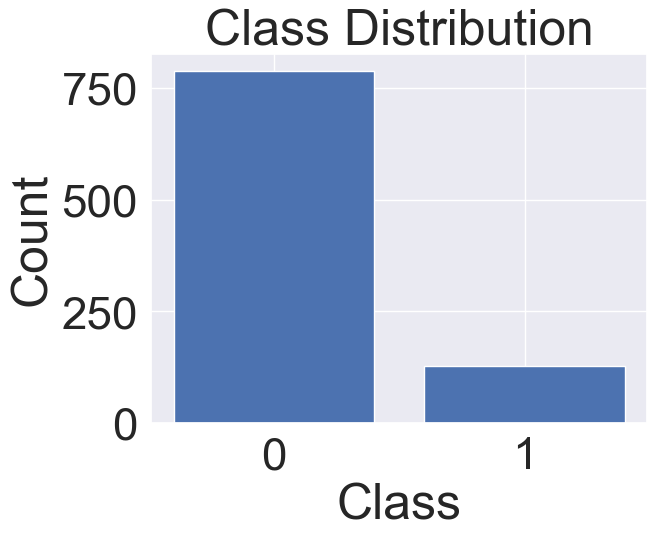

In [60]:
#visualization of the trained data for better understanding
plt.bar(class_counts.keys(), class_counts.values())
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.show()

### MODEL PREDICTION

In [61]:
svc_model=SVC(C=50,kernel="rbf")

# fit model
svc_model.fit(x_train,y_train)

y_pred_svc =svc_model.predict(x_test)

print("Score the X-train with Y-train is : ", svc_model.score(x_train,y_train))
print("Score the X-test  with Y-test  is : ", svc_model.score(x_test,y_test))
print(" Model Evaluation Decision Tree : accuracy score " , accuracy_score(y_test,y_pred_svc))

Score the X-train with Y-train is :  0.8610503282275711
Score the X-test  with Y-test  is :  0.8602620087336245
 Model Evaluation Decision Tree : accuracy score  0.8602620087336245


### The quality of the wine is segregated based upon the classes of bad and good as well as its features
### Randomforestclassifier is used to check the accuracy which produces an accuracy of 89% 
### SVC[Support Vector Classifier] is initialized where the training and testing predicted model produce an accuracy of the above 
### Logistic regression is also done for training the model .
### Stochastic Gradient Descent produce an accuracy of 82%

- 

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=465f362d-158c-47df-86be-9ea859bfe1b7' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>